<a href="https://colab.research.google.com/github/cdedow/FWE458_2025/blob/main/Homework9_Dedow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler

In [2]:
#mounting drive and loading dataset
from google.colab import drive
drive.mount('/content/drive')

filedir = '/content/drive/MyDrive/FWE458/ColabNotebooks/'

fname = filedir + "SW_with_AOD.csv" #preparing to load into data frame

df = pd.read_csv(fname) #loaded the file into a pandas data frame
df.head() #displayed the first 5 rows

Mounted at /content/drive


,SZA,AOD,COD,CLD_FRAC,UW,TO3,Pressure,BSA,WSA,SW_direct,SW_diffuse
0,24.936783,1.172892,2.440000,0.286546,2.021502,311.419861,959.085083,0.162,0.193,467.191650,300.820007
1,34.865055,1.626954,4.630000,0.468832,4.859887,308.713379,968.427551,0.155,0.169,264.900024,385.293335
2,27.330978,1.095007,2.030000,0.301414,5.278558,293.322052,988.040588,0.136,0.149,313.553314,321.538361
3,20.361732,1.126541,5.500000,0.377019,4.856422,321.498199,977.610229,0.156,0.179,143.902298,501.073639
4,13.433228,0.725452,0.736076,0.075378,0.644262,295.448975,882.321411,0.188,0.212,957.331665,79.003334


In [3]:
#checking for missing values and outliers

df_clean = df.dropna() #drop all values that are na in the columns

numeric_cols = df_clean.select_dtypes(include=np.number).columns #putting all of the numeric columns in a group for for loop

# apply the IQR method
for col in numeric_cols:
    Q1 = df_clean[col].quantile(0.25) #determines lower quantile
    Q3 = df_clean[col].quantile(0.75) #determines upper quantile
    IQR = Q3 - Q1 #finds middle quantile area
    lower_bound = Q1 - 1.5 * IQR #determines lower bound
    upper_bound = Q3 + 1.5 * IQR #determines upper bound
    df_clean = df_clean[(df_clean[col] >= lower_bound) & (df_clean[col] <= upper_bound)] #cleans the dataset based on the bounds

df_clean.head() #display again to ensure everything looks right

,SZA,AOD,COD,CLD_FRAC,UW,TO3,Pressure,BSA,WSA,SW_direct,SW_diffuse
0,24.936783,1.172892,2.440000,0.286546,2.021502,311.419861,959.085083,0.162,0.193,467.191650,300.820007
2,27.330978,1.095007,2.030000,0.301414,5.278558,293.322052,988.040588,0.136,0.149,313.553314,321.538361
8,18.907768,1.368472,4.190000,0.352891,4.550652,332.157013,965.883362,0.156,0.178,620.738831,294.402924
9,23.763657,0.634788,2.470000,0.171280,4.244967,296.207581,1002.127625,0.143,0.155,574.700012,217.214996
10,32.231800,0.613652,1.662467,0.193884,1.781187,360.252350,938.585510,0.140,0.159,246.403351,393.006653


In [4]:
#create the new columns

df_clean['SW_total'] = df_clean['SW_direct'] + df_clean['SW_diffuse'] #creates the total column

df_clean.head() #ensures new column was made

,SZA,AOD,COD,CLD_FRAC,UW,TO3,Pressure,BSA,WSA,SW_direct,SW_diffuse,SW_total
0,24.936783,1.172892,2.440000,0.286546,2.021502,311.419861,959.085083,0.162,0.193,467.191650,300.820007,768.011658
2,27.330978,1.095007,2.030000,0.301414,5.278558,293.322052,988.040588,0.136,0.149,313.553314,321.538361,635.091675
8,18.907768,1.368472,4.190000,0.352891,4.550652,332.157013,965.883362,0.156,0.178,620.738831,294.402924,915.141754
9,23.763657,0.634788,2.470000,0.171280,4.244967,296.207581,1002.127625,0.143,0.155,574.700012,217.214996,791.915008
10,32.231800,0.613652,1.662467,0.193884,1.781187,360.252350,938.585510,0.140,0.159,246.403351,393.006653,639.410004


In [5]:
#define custom function
def SW_total_category(value): #define and give the function a name and input space
  if value < df_clean['SW_total'].quantile(0.25): #if statement checks if input is in lowest 25%
    return "Q1" #it will return Q1
  elif value < df_clean['SW_total'].quantile(0.5): #else if statement checks if input is in lowest 50%
    return "Q2" #it will return Q2
  elif value < df_clean['SW_total'].quantile(0.75): #else if statement checks if input is in lowest 75%
    return "Q3" #it will return Q3
  else: #anything else (greater than 75%)
    return "Q4" #it will return Q4

df_clean['SW_total_category'] = df_clean['SW_total'].apply(SW_total_category) #applies the function to the dataset

df_clean.head() #ensures function worked

,SZA,AOD,COD,CLD_FRAC,UW,TO3,Pressure,BSA,WSA,SW_direct,SW_diffuse,SW_total,SW_total_category
0,24.936783,1.172892,2.440000,0.286546,2.021502,311.419861,959.085083,0.162,0.193,467.191650,300.820007,768.011658,Q3
2,27.330978,1.095007,2.030000,0.301414,5.278558,293.322052,988.040588,0.136,0.149,313.553314,321.538361,635.091675,Q3
8,18.907768,1.368472,4.190000,0.352891,4.550652,332.157013,965.883362,0.156,0.178,620.738831,294.402924,915.141754,Q4
9,23.763657,0.634788,2.470000,0.171280,4.244967,296.207581,1002.127625,0.143,0.155,574.700012,217.214996,791.915008,Q4
10,32.231800,0.613652,1.662467,0.193884,1.781187,360.252350,938.585510,0.140,0.159,246.403351,393.006653,639.410004,Q3


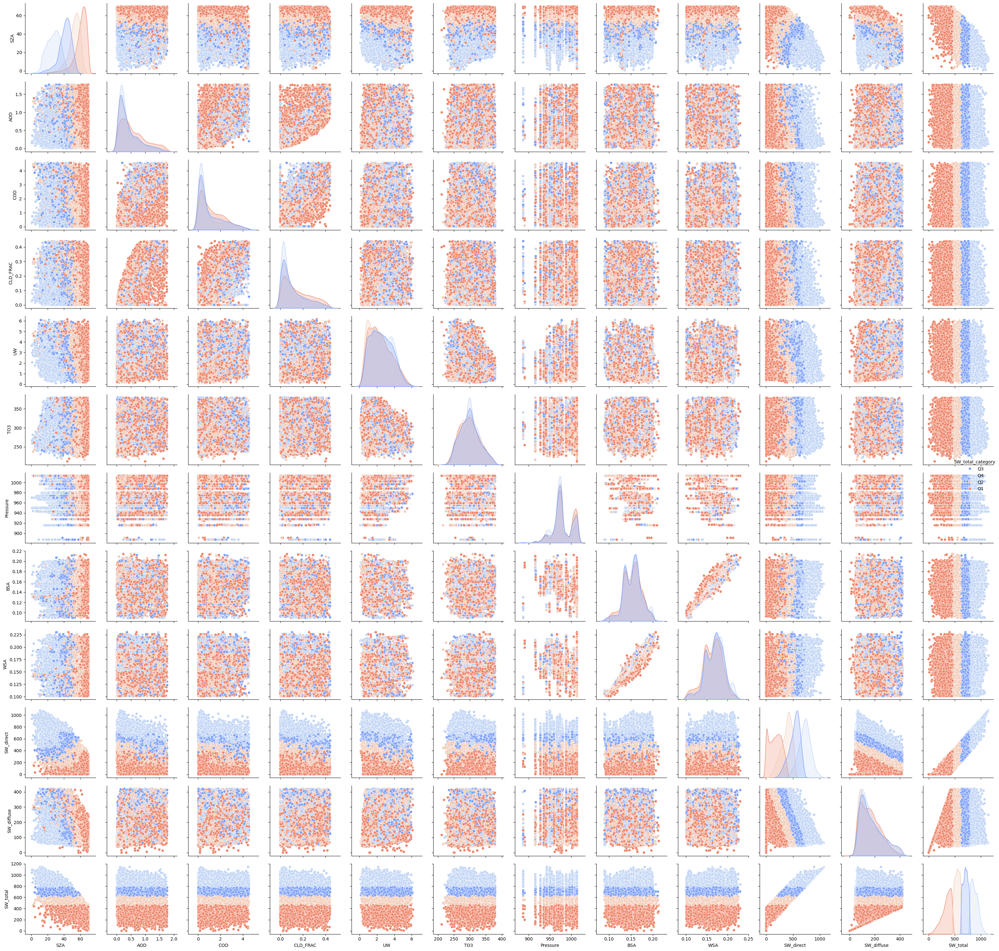

In [6]:
# select the columns I am going to plot
cols_to_plot = ['SZA', 'AOD', 'COD', 'CLD_FRAC', 'UW', 'TO3', 'Pressure', 'BSA', 'WSA',
                'SW_direct', 'SW_diffuse', 'SW_total', 'SW_total_category']

#create the pairplot using the columns chosen and change the color based on the category
sns.pairplot(df_clean[cols_to_plot], hue='SW_total_category', palette='coolwarm')
plt.tight_layout()
plt.show()

In [7]:
#import necessary package
from sklearn.preprocessing import StandardScaler

# Define features (excluding target columns)
features = ['SZA', 'AOD', 'COD', 'CLD_FRAC', 'UW', 'TO3', 'Pressure', 'BSA', 'WSA'] #including the inputs, but not the targets
scaler = StandardScaler()
df_scaled = df_clean.copy()
df_scaled[features] = scaler.fit_transform(df_clean[features]) #applies the scaler to the input columns

In [8]:
#unsupervised learning

# selecting for the input feature columns (excluding SW variables and categorical columns)
features = ['SZA', 'AOD', 'COD', 'CLD_FRAC', 'UW', 'TO3', 'Pressure', 'BSA', 'WSA']
X = df_clean[features]

# normalize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X) #scale these again under a new variable so i could continue to use it

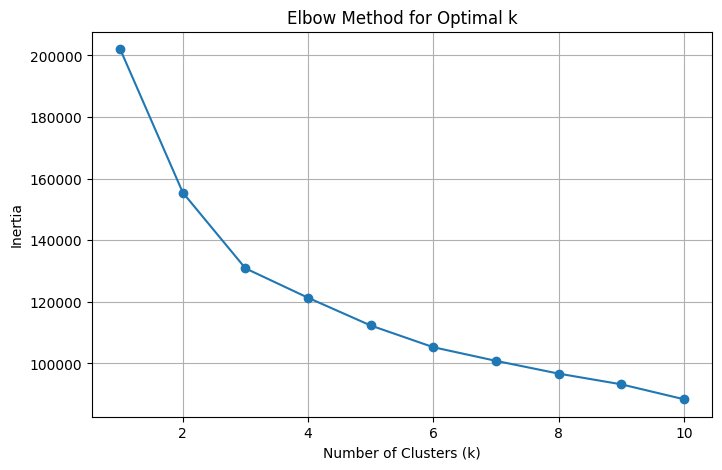

In [9]:
#import more packages
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# establish this so that it can try a different numbers of clusters
inertia = []
K = range(1, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42) #use kmeans function
    kmeans.fit(X_scaled) #apply it to the scaled input values
    inertia.append(kmeans.inertia_) #add the value onto the empty list with the value

# plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(K, inertia, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.grid(True)
plt.show()


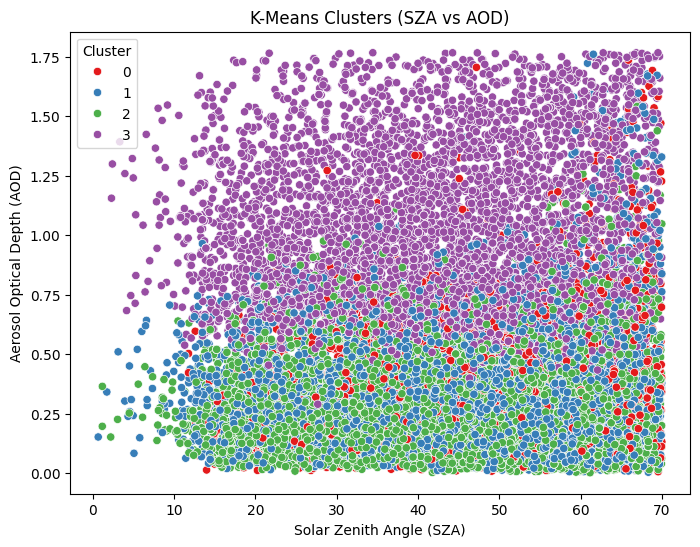

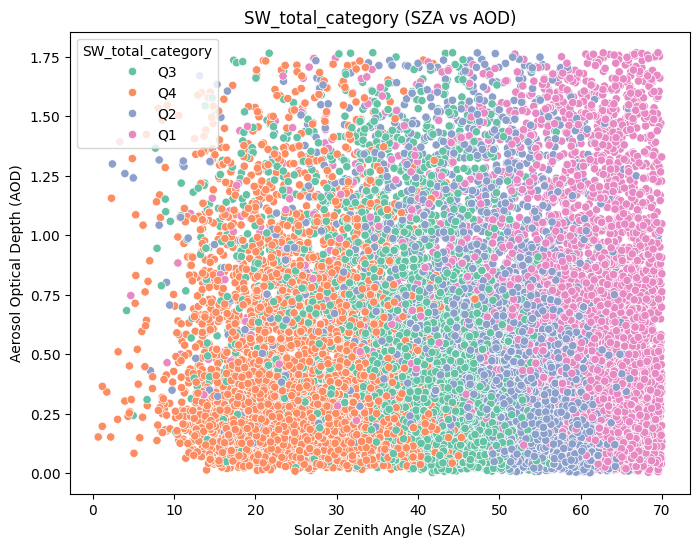

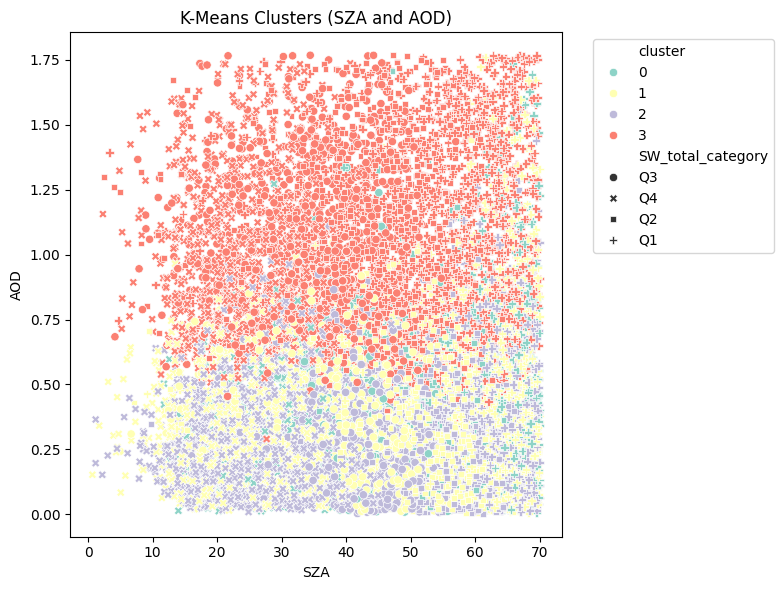

In [10]:
# fit the final KMeans using 4 as the optimal number of clusters
optimal_k = 4
kmeans = KMeans(n_clusters=optimal_k, random_state=42) #fit the model
df_clean['cluster'] = kmeans.fit_predict(X_scaled) #create a new column with the prediciton

# visualize the clusters using SZA and AOD)
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_clean, x='SZA', y='AOD', hue='cluster', palette='Set1')
plt.title('K-Means Clusters (SZA vs AOD)')
plt.xlabel('Solar Zenith Angle (SZA)')
plt.ylabel('Aerosol Optical Depth (AOD)')
plt.legend(title='Cluster')
plt.show()

#analyze whether the clusters align with SW_total_category
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_clean, x='SZA', y='AOD', hue='SW_total_category', palette='Set2')
plt.title('SW_total_category (SZA vs AOD)')
plt.xlabel('Solar Zenith Angle (SZA)')
plt.ylabel('Aerosol Optical Depth (AOD)')
plt.legend(title='SW_total_category')
plt.show()

# I plotted them together on one axis as well
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_clean, x='SZA', y='AOD', hue='cluster', palette='Set3', style='SW_total_category')
plt.title('K-Means Clusters (SZA and AOD)')
plt.xlabel('SZA')
plt.ylabel('AOD')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


Interpretation: Looking at the KMeans clustering, it appears that there is more of a horizontal division among the clusters, suggesting that AOD was an important feature in determining the clusters. However, when viewing it based on category, it appears that there was more of a vertical division. When the two are overlayed, there does seem to be some consistencies between the two, but the clustering may not be as meaningful as we had hoped.

In [11]:
# mean feature values by cluster
cluster_summary = df_clean.groupby('cluster')[features + ['SW_total']].mean()
print(cluster_summary)


               SZA       AOD       COD  CLD_FRAC        UW         TO3  \
cluster                                                                  
0        47.378864  0.314690  0.596323  0.067991  1.616347  334.342093   
1        46.313359  0.328042  0.735248  0.087344  2.622215  283.861748   
2        44.568182  0.257490  0.572484  0.061295  2.492695  287.092392   
3        42.544479  1.033047  2.682754  0.285188  2.889255  300.334742   

           Pressure       BSA       WSA    SW_total  
cluster                                              
0        977.965223  0.155217  0.168374  622.941000  
1        993.939397  0.131341  0.141091  600.246919  
2        966.695174  0.169002  0.183477  652.816946  
3        979.888220  0.153253  0.167725  578.224729  


I printed this as well just to show some interesting comparisons between the variables.

In [12]:
#supervised learning

#import package for training and testing data
from sklearn.model_selection import train_test_split

# input features (exclude all radiation + categorical labels)
X = df_clean[features]
y = df_clean['SW_total']

# split training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [13]:
#import more packages for learning
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# decision tree
dt = DecisionTreeRegressor(random_state=42) #set up regressor model
dt.fit(X_train, y_train) #fit the model to the training set
dt_preds = dt.predict(X_test) #use set to predict for the testing data

# random forest
rf = RandomForestRegressor(n_estimators=100, random_state=42) #set up regressor model
rf.fit(X_train, y_train) #fit the model to the training set
rf_preds = rf.predict(X_test) #predict for the testing set

# evaluate the metrics to compare, used function to keep it clearer
def print_regression_metrics(name, y_true, y_pred): #define function
    rmse = np.sqrt(mean_squared_error(y_true, y_pred)) #find rmse
    r2 = r2_score(y_true, y_pred) #find r2
    print(f"{name} RMSE: {rmse:.2f}") #print out these value found
    print(f"{name} R²: {r2:.3f}")

print_regression_metrics("Decision Tree", y_test, dt_preds) #print these out from function
print_regression_metrics("Random Forest", y_test, rf_preds)


Decision Tree RMSE: 120.61
Decision Tree R²: 0.674
Random Forest RMSE: 86.88
Random Forest R²: 0.831


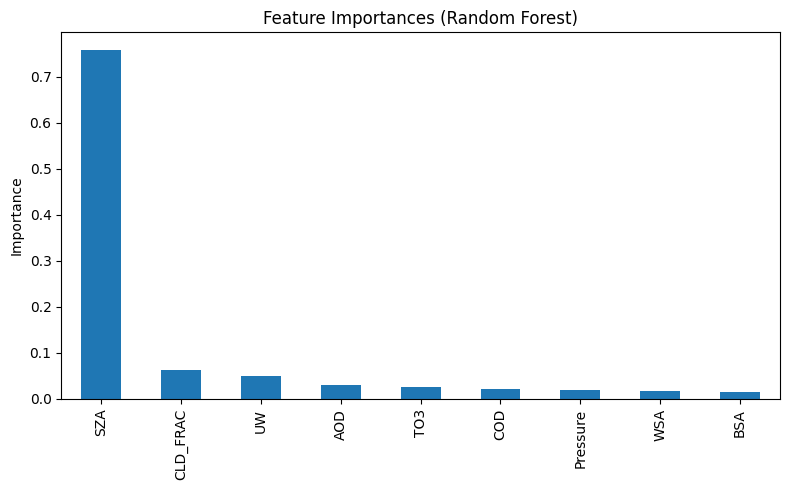

In [14]:
#imported packages again to ensure they will work in with the data
import pandas as pd
import matplotlib.pyplot as plt

# get feature importances
importances = pd.Series(rf.feature_importances_, index=features).sort_values(ascending=False)

# plot
plt.figure(figsize=(8, 5))
importances.plot(kind='bar')
plt.title('Feature Importances (Random Forest)')
plt.ylabel('Importance')
plt.tight_layout()
plt.show()


Based on the random forest regressor, SZA has a substantial feature importance while the rest of the features appear to be minor compared to it.

In [15]:
#import package
from sklearn.preprocessing import LabelEncoder

# encode SW_total_category labels
le = LabelEncoder()
y_cat = le.fit_transform(df_clean['SW_total_category'])  # Q1-Q4 → 0-3 to make it easier to use

# split the data into training and testing sets
X_train, X_test, y_train_cat, y_test_cat = train_test_split(X, y_cat, test_size=0.2, random_state=42)


In [16]:
#import packages
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# perform KNN
knn = KNeighborsClassifier(n_neighbors=5) #establish model
knn.fit(X_train, y_train_cat) #fit the model to the training data
knn_preds = knn.predict(X_test) #use model to predict on testing data

# Naive Bayes
gnb = GaussianNB() #establish model
gnb.fit(X_train, y_train_cat) #fit model to training data
gnb_preds = gnb.predict(X_test) #make predictions for testing data



K-Nearest Neighbors Classification Report:
              precision    recall  f1-score   support

          Q1       0.74      0.69      0.71      1114
          Q2       0.57      0.59      0.58      1106
          Q3       0.62      0.62      0.62      1145
          Q4       0.78      0.80      0.79      1124

    accuracy                           0.67      4489
   macro avg       0.68      0.67      0.68      4489
weighted avg       0.68      0.67      0.68      4489



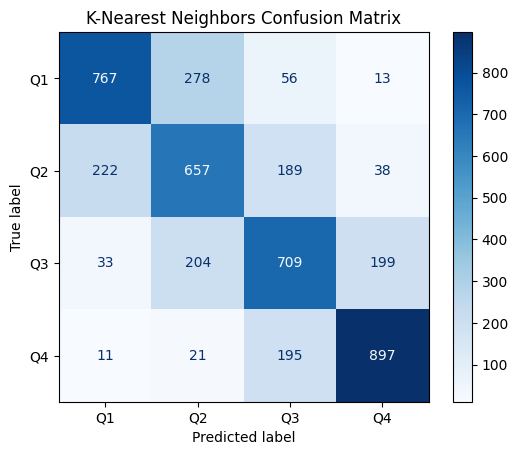


Gaussian Naive Bayes Classification Report:
              precision    recall  f1-score   support

          Q1       0.74      0.72      0.73      1114
          Q2       0.59      0.61      0.60      1106
          Q3       0.61      0.61      0.61      1145
          Q4       0.80      0.79      0.80      1124

    accuracy                           0.68      4489
   macro avg       0.69      0.68      0.68      4489
weighted avg       0.69      0.68      0.68      4489



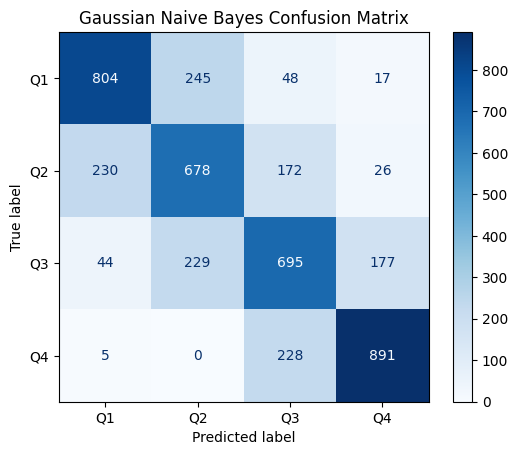

In [17]:
#developed function for confusion matrix and classification report
def evaluate_classifier(name, y_true, y_pred):
    print(f"\n{name} Classification Report:")
    print(classification_report(y_true, y_pred, target_names=le.classes_)) #get classification report for each quartile

    cm = confusion_matrix(y_true, y_pred) #confusion matrix report
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
    disp.plot(cmap='Blues') #plot the map
    plt.title(f"{name} Confusion Matrix")
    plt.show()

evaluate_classifier("K-Nearest Neighbors", y_test_cat, knn_preds) #perform funcion on k-nearest neighbor set
evaluate_classifier("Gaussian Naive Bayes", y_test_cat, gnb_preds) #perform function on gaussian


It appears that the Gaussian performed slightly better overall. It had a slightly better accuracy, as well as precision and recall, but not by much. It had the same f-1 score as K-Nearest Neighbors. I do think it is interesting to note that both were able to predict Q1 and Q4 very precisely, while both struggled more with Q2 and Q3. However, overall the Gaussian seemed to have a slightly better performance.

Reflection: The most important features for predicting total shortwave radiation (SW_total) appear to be AOD (Aerosol Optical Depth) and SZA (Solar Zenith Angle). KMeans clustering suggested that AOD is an important feature while random forest suggesting the SZA was an important feature.

The cluster analysis reveals clear groupings: Cluster 3 was focused more at a high AOD and a lower SZA which was associated with a higher SW total., while clusters 0 to 2 were focused more at a lower AOD and higher SZA and was associated with a lower SW total. This may be beneficial to consider when looking at SW total. When performing classification models, the results showed that Q4, which had the highest SW_total, was predicted the most precisely. Q1, which had the lowest SW_total, also had a higher precision. This may lead us to conclude that the classification model works well with the more distinct categories in SW_total. This is supported by our clustering overlap, which seemed to align more with cluster 0 and cluster 3 for Q1 and Q4, while Q2 and Q3 seemed rather mixed.

Based on these results, I would recommend using the Gaussian Naive Bayes for solar radiation prediction. I think using random forest for determining important features may be beneficial as well considering its higher r-squared value. For further improvement, I would consider using a gradient boosting model, like what we learned in class on Tuesday. This may be beneifical in further distinguishing Q2 and Q3 better.

